# PROJET 3 : PREPARER DES DONNEES POUR UN ORGANISME DE SANTE PUBLIQUE

## PRESENTATION GENERALE DU JEU DE DONNEES

### Importer les librairies

In [1]:
import pandas as pd
import numpy as np
import seaborn as sb
from scipy import stats
from scipy.stats import uniform
from scipy.stats import norm
from scipy.stats import beta
from sklearn import decomposition
from sklearn import preprocessing
from functions import *
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
import plotly.express as px

### Charger le fichier dans un dataframe

In [2]:
missing_values = ["n/a", "na", "--", "0"]

In [3]:
df = pd.read_table("fr.openfoodfacts.org.products.csv", na_values= missing_values)

C:\Users\JK253\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3338: DtypeWarning: Columns (0,3,5,19,20,24,25,26,27,28,35,36,37,38,39,48) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


En chargeant le fichier dans ma dataframe, je lui indique que la valeur missing_values est une valeur manquante (na_values= missing_values).

### Nombre de lignes et de colonnes

In [4]:
df.shape

(320772, 162)

Le jeu de données comporte 320 772 lignes et 162 colonnes.

### Afficher les 5 première lignes de ma dataframe

In [5]:
df.head(5)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,3087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,4559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,16087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,16094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Cette visualisation me permet de voir de quoi parle ma dataframe avec ces 5 premières lignes de valeurs avec la présence ou non de valeurs manquante.

### Afficher les 5 dernières lignes de ma dataframe

In [6]:
df.tail(5)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
320767,9948282780603,http://world-fr.openfoodfacts.org/produit/9948...,openfoodfacts-contributors,1490631299,2017-03-27T16:14:59Z,1491244498,2017-04-03T18:34:58Z,Tomato & ricotta,NaN,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320768,99567453,http://world-fr.openfoodfacts.org/produit/9956...,usda-ndb-import,1489059076,2017-03-09T11:31:16Z,1491244499,2017-04-03T18:34:59Z,"Mint Melange Tea A Blend Of Peppermint, Lemon ...",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320769,9970229501521,http://world-fr.openfoodfacts.org/produit/9970...,tomato,1422099377,2015-01-24T11:36:17Z,1491244499,2017-04-03T18:34:59Z,乐吧泡菜味薯片,Leba pickle flavor potato chips,50 g,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320770,9980282863788,http://world-fr.openfoodfacts.org/produit/9980...,openfoodfacts-contributors,1492340089,2017-04-16T10:54:49Z,1492340089,2017-04-16T10:54:49Z,Tomates aux Vermicelles,NaN,67g,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320771,999990026839,http://world-fr.openfoodfacts.org/produit/9999...,usda-ndb-import,1489072709,2017-03-09T15:18:29Z,1491244499,2017-04-03T18:34:59Z,"Sugar Free Drink Mix, Peach Tea",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Cette visualisation me permet de voir les 5 dernière lignes de valeurs avec la présence ou non de valeur manquante.

### Verifier les différents types de nos variable

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Columns: 162 entries, code to water-hardness_100g
dtypes: float64(106), object(56)
memory usage: 396.5+ MB


In [8]:
df.dtypes.value_counts()

float64    106
object      56
dtype: int64

On dispose de 56 variables qualitatives et 106 variables quantitatives

### Nombre de valeurs manquantes

<AxesSubplot:>

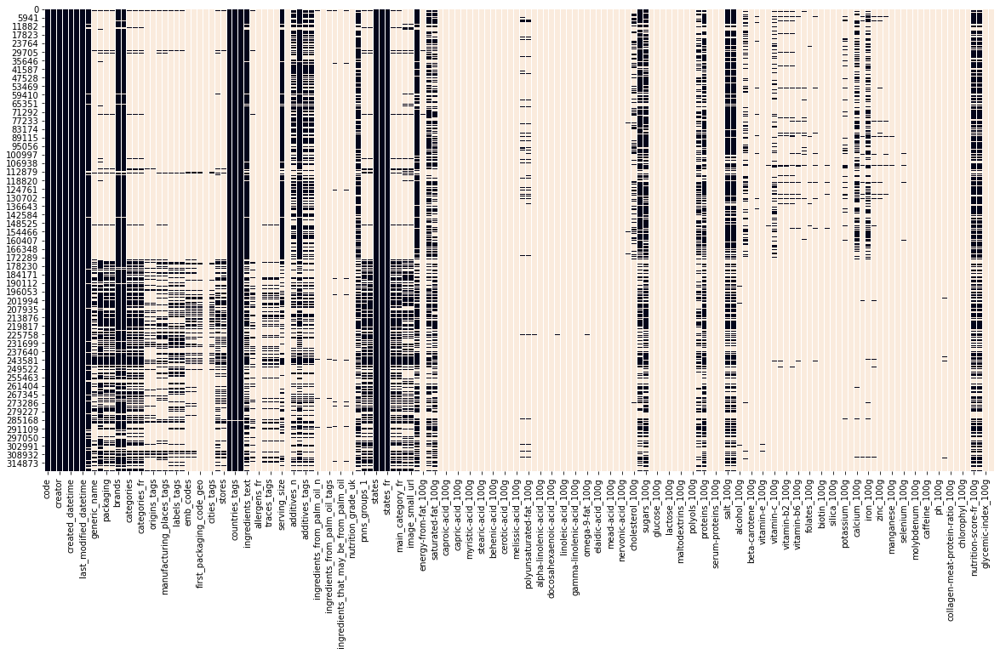

In [9]:
plt.figure(figsize=(20,10))
sb.heatmap(df.isna(), cbar=False)

Ce graphique me permet de voir un grand nombre de valeurs manquantes qui apparaissent en jaune.

### Nombre de valeurs manquantes

In [10]:
(df.isna().sum()/df.shape[0]).sort_values(ascending=True)

last_modified_t                          0.000000
last_modified_datetime                   0.000000
creator                                  0.000006
created_t                                0.000012
created_datetime                         0.000028
                                           ...   
ingredients_that_may_be_from_palm_oil    1.000000
ingredients_from_palm_oil                1.000000
no_nutriments                            1.000000
nervonic-acid_100g                       1.000000
water-hardness_100g                      1.000000
Length: 162, dtype: float64

In [11]:
df.isnull().sum().sum()

41113087

Le jeu de données comporte 41 113 087 valeurs manquantes.

##  DEMARCHE METHODOLOGIQUE DE L'ANALYSE DE DONNEES

### Supprimer des variables

#### En regardant les différentes variables ci-dessus, je vais supprimer les variables suppérieur à 50% de valeurs manquantes.

In [12]:
column_with_nan = df.columns[df.isnull().any()]

Je détermine le nombre de valeurs manquantes par colonnes par l'intermédiaire de la variable 'column_with_nan'

In [13]:
 df.shape

(320772, 162)

Avant l'opération de suppression je dispose de 320 772 lignes et de 162 colonnes

In [14]:
for column in column_with_nan:
    print(column, df[column].isnull().sum())

code 23
url 23
creator 2
created_t 4
created_datetime 9
product_name 17762
generic_name 267977
quantity 215960
packaging 241812
packaging_tags 241811
brands 28413
brands_tags 28426
categories 236362
categories_tags 236383
categories_fr 236361
origins 298582
origins_tags 298619
manufacturing_places 284271
manufacturing_places_tags 284299
labels 274213
labels_tags 274128
labels_fr 274127
emb_codes 291466
emb_codes_tags 291469
first_packaging_code_geo 301969
cities 320749
cities_tags 300452
purchase_places 262579
stores 269050
countries 280
countries_tags 280
countries_fr 280
ingredients_text 71810
allergens 292428
allergens_fr 320753
traces 296419
traces_tags 296443
traces_fr 296420
serving_size 109450
no_nutriments 320772
additives_n 166092
additives 71867
additives_tags 166092
additives_fr 166092
ingredients_from_palm_oil_n 315937
ingredients_from_palm_oil 320772
ingredients_from_palm_oil_tags 315937
ingredients_that_may_be_from_palm_oil_n 309076
ingredients_that_may_be_from_palm_oil 3

In [15]:
for column in column_with_nan:
    if df[column].isnull().sum()*100.0/df.shape[0] > 50:
        df.drop(column,1, inplace=True)

In [16]:
df.shape

(320772, 30)

In [17]:
df.dtypes.value_counts()

object     20
float64    10
dtype: int64

On dispose à présent de 20 variables qualitatives et 10 variables quantitative.

### Couper notre dataframe en 2 parties ((Categorique : Qualitative) et (Numérique : Quantitative))

cat_data: Categorique et num_data: Numerique

In [18]:
cat_data=[]
num_data=[]

for i,c in enumerate(df.dtypes):
    if c==object:
        cat_data.append(df.iloc[:,i])
    else:
        num_data.append(df.iloc[:,i]) 
cat_data=pd.DataFrame(cat_data).transpose()
num_data=pd.DataFrame(num_data).transpose()

Cette condition me permet de traiter de manière séparer les variables qualitative dite 'categorique' et les variables quantitative dite 'numerique'

### Remplacer les valeurs manquantes Categorique

Pour les variables qualitative on va remplacer les valeurs manquantes par les valeurs qui se répétent le plus souvent.

In [19]:
cat_data=cat_data.apply(lambda x:x.fillna(x.value_counts().index[0]))
cat_data.isnull().sum()

code                      0
url                       0
creator                   0
created_t                 0
created_datetime          0
last_modified_t           0
last_modified_datetime    0
product_name              0
brands                    0
brands_tags               0
countries                 0
countries_tags            0
countries_fr              0
ingredients_text          0
serving_size              0
additives                 0
nutrition_grade_fr        0
states                    0
states_tags               0
states_fr                 0
dtype: int64

Nous constatons qu'il n'y a plus aucune valeur qualitative manquante.

### Remplacer les valeurs manquantes Numerique

In [20]:
num_data = num_data.fillna(num_data.median())
num_data.isnull().sum()

energy_100g                0
fat_100g                   0
saturated-fat_100g         0
carbohydrates_100g         0
sugars_100g                0
proteins_100g              0
salt_100g                  0
sodium_100g                0
nutrition-score-fr_100g    0
nutrition-score-uk_100g    0
dtype: int64

Nous constatons qu'il n'y a plus aucune valeur quantitative manquante.

### Résumer statistique des variables Categorique de manière rapide

In [21]:
cat_data.describe()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,brands,brands_tags,countries,countries_tags,countries_fr,ingredients_text,serving_size,additives,nutrition_grade_fr,states,states_tags,states_fr
count,320772,320772,320772,320772,320772,320772,320772,320772,320772,320772,320772,320772,320772,320772,320772,320772,320772,320772,320772,320772
unique,320638,320749,3535,189635,189568,180639,180495,221347,58783,50252,1434,725,722,205520,25422,196069,5,1021,1021,1021
top,851087000250,http://world-fr.openfoodfacts.org/produit/0039...,usda-ndb-import,1489077120,2017-03-09T10:37:09Z,1439141742,2015-08-09T17:35:42Z,Ice Cream,Carrefour,carrefour,US,en:united-states,États-Unis,"Carbonated water, natural flavor.",240 ml (8 fl oz),[ extra-virgin-olive-oil -> en:extra-virgin-o...,d,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl..."
freq,25,24,169870,24,29,33,33,18172,31391,31575,170208,173278,173278,72032,114946,72264,162325,168951,168951,168951


Le tableau ci-dessus montre le nombre de valeurs, le numéros unique, le mode et la fréquence pour chaque variable categorique.

### Résumer statistique des variables numerique de manière rapide

In [22]:
num_data.describe()

,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
count,3.207720e+05,320772.000000,320772.000000,320772.000000,320772.000000,320772.000000,3.207720e+05,3.207720e+05,320772.000000,320772.000000
mean,1.175999e+03,14.933142,5.915072,32.425402,15.423975,8.114114,1.856043e+00,7.307277e-01,10.172593,9.774017
std,5.813586e+03,14.064055,6.317097,24.748338,19.171269,6.921555,1.144799e+02,4.507081e+01,7.305940,7.381454
min,2.000000e-02,0.000100,0.000100,0.001000,-17.860000,-800.000000,5.000000e-08,1.968504e-08,-15.000000,-15.000000
25%,5.980000e+02,9.820000,4.460000,13.900000,5.000000,5.000000,4.000000e-01,1.574803e-01,6.000000,6.000000
50%,1.153000e+03,11.920000,4.500000,26.200000,9.100000,6.670000,7.747000e-01,3.050000e-01,11.000000,10.000000
75%,1.569000e+03,14.290000,4.500000,49.900000,14.840000,8.240000,1.115060e+00,4.390000e-01,13.000000,13.000000
max,3.251373e+06,714.290000,550.000000,2916.670000,3520.000000,430.000000,6.431280e+04,2.532000e+04,40.000000,40.000000


Le tableau ci-dessus montre le nombre de valeurs, la moyenne, l'écart-type, la valeur minimum, le 1er quartile, le 2ème quartile, le 3ème quartile et la valeur maximum pour chaque variable numérique. Nèanmois, je constate que les variables numérique ont un écart type très élevé cela indique la présence d'outliers de plus elles comportent des valeurs supérieur à 100g.

### Réunir les dataframes catégorique et numèrique dans une seul dataframe(df)

In [23]:
df=pd.concat([cat_data,num_data], axis=1)

J'ai concaténer cat_data et num_data pour créer une seul dataframe(df)

### Affichage de mon jeu de données

<AxesSubplot:>

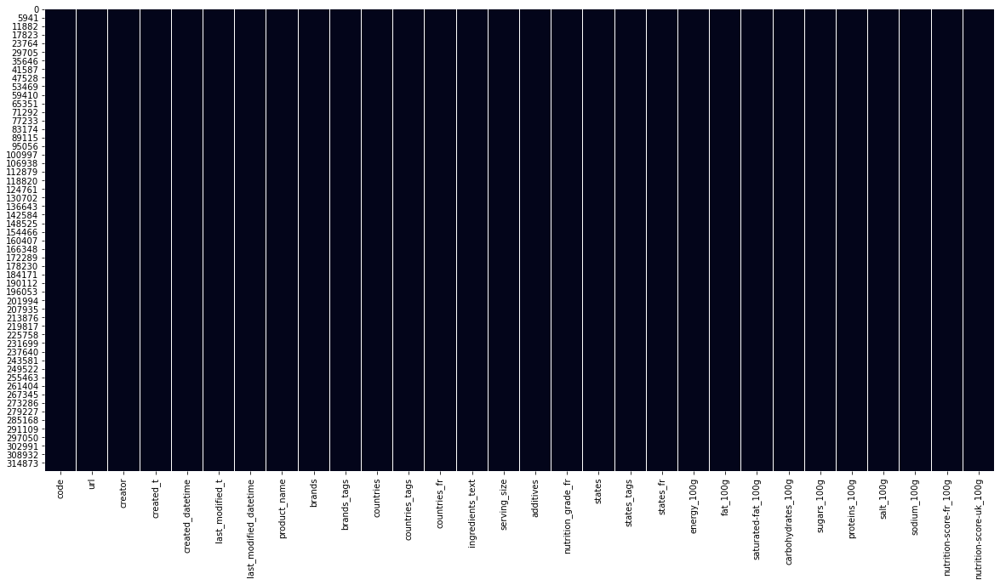

In [24]:
plt.figure(figsize=(20,10))
sb.heatmap(df.isna(), cbar=False)

On constate sur ce graphique qu'il n'y a plus de valeurs manquantes 

### Résumer statistique du dataframe

In [25]:
df.describe(include='all')

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,brands,brands_tags,...,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
count,3.207720e+05,320772,320772,3.207720e+05,320772,3.207720e+05,320772,320772,320772,320772,...,3.207720e+05,320772.000000,320772.000000,320772.000000,320772.000000,320772.000000,3.207720e+05,3.207720e+05,320772.000000,320772.000000
unique,3.206380e+05,320749,3535,1.896350e+05,189568,1.806390e+05,180495,221347,58783,50252,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,8.510870e+11,http://world-fr.openfoodfacts.org/produit/0039...,usda-ndb-import,1.489077e+09,2017-03-09T10:37:09Z,1.439142e+09,2015-08-09T17:35:42Z,Ice Cream,Carrefour,carrefour,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,2.500000e+01,24,169870,2.400000e+01,29,3.300000e+01,33,18172,31391,31575,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.175999e+03,14.933142,5.915072,32.425402,15.423975,8.114114,1.856043e+00,7.307277e-01,10.172593,9.774017
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.813586e+03,14.064055,6.317097,24.748338,19.171269,6.921555,1.144799e+02,4.507081e+01,7.305940,7.381454
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.000000e-02,0.000100,0.000100,0.001000,-17.860000,-800.000000,5.000000e-08,1.968504e-08,-15.000000,-15.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.980000e+02,9.820000,4.460000,13.900000,5.000000,5.000000,4.000000e-01,1.574803e-01,6.000000,6.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.153000e+03,11.920000,4.500000,26.200000,9.100000,6.670000,7.747000e-01,3.050000e-01,11.000000,10.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.569000e+03,14.290000,4.500000,49.900000,14.840000,8.240000,1.115060e+00,4.390000e-01,13.000000,13.000000


Le tableau nous montre des valeurs 'NaN' celà est normal car des variables qualitative ne peuvent pas avoir de moyenne, ecart-type, valeur mini, 1er quartile, 2ème quartile, 3ème quartile et valeur max et des variables quantitative ne peuvent pas avoir de valeur unique, de valeur haute(mode) et de fréquence.

### Remplacer les valeurs Outliers Numerique

#### Détecter les valeurs aberrante de la variable 'energy_100g' de manière inéractive

In [26]:
px.box(x=df['energy_100g'])

Le diagramme en moustache détecte un grand nombre de valeur aberrante celà ce distingue par une droite vertical et des points espacé.

#### Utilisation de la méthode interquartile sur la variable 'energy_100g'

In [27]:
Q1=df['energy_100g'].quantile(0.25)
Q3=df['energy_100g'].quantile(0.75)
IQR=Q3-Q1
print(Q1)
print(Q3)
print(IQR)
Lower_Whisker = Q1 - 1.5*IQR
Upper_Whisker = Q3 + 1.5*IQR
print(Lower_Whisker, Upper_Whisker)

598.0
1569.0
971.0
-858.5 3025.5


Cette méthode me permet de relever les points de données qui tombe en dehors de 1,5 fois d’une plage interquartile au-dessus du 3e quartile (Q3= 1569) et en dessous du 1er quartile (Q1= 598)

#### Traitement des valeurs aberrante 'energy_100g' de manière inéractive

La mèthoque que j'utilise ci-dessous est de définir une variable nommé mask intégrant les valeurs non aberrante, ensuite redéfinir la variable 'energy_100g' en lui imputant la valeur haute sur les valeurs aberrante.

In [28]:
mask = (df['energy_100g']>0) & (df['energy_100g']<Upper_Whisker)
df['energy_100g'] = df['energy_100g'].where(mask, Upper_Whisker)

In [29]:
px.box(x=df['energy_100g'])

Le diagramme moustache nous montre que la variable 'energy_100g' est totalement nettoyer, plus de présence de valeur aberrante.

#### Détecter les valeurs aberrante de la variable 'fat_100g'

<AxesSubplot:xlabel='fat_100g'>

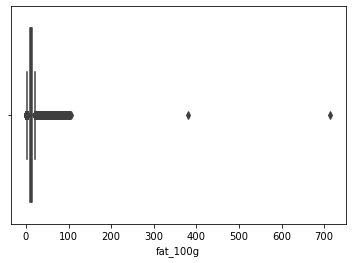

In [30]:
sb.boxplot(x=df['fat_100g'])

Le diagramme en moustache détecte un grand nombre de valeur aberrante celà ce distingue par une droite vertical et des points espacé.

#### Utilisation de la méthode interquartile sur la variable 'fat_100g'

In [31]:
Q1=df['fat_100g'].quantile(0.25)
Q3=df['fat_100g'].quantile(0.75)
IQR=Q3-Q1
print(Q1)
print(Q3)
print(IQR)
Lower_Whisker = Q1 - 1.5*IQR
Upper_Whisker = Q3 + 1.5*IQR
print(Lower_Whisker, Upper_Whisker)

9.82
14.29
4.469999999999999
3.115000000000002 20.994999999999997


Cette méthode me permet de relever les points de données qui tombe en dehors de 1,5 fois d’une plage interquartile au-dessus du 3e quartile (Q3= 14.29) et en dessous du 1er quartile (Q1= 9.82)

#### Traitement des valeurs aberrante 'fat_100g'

La mèthoque que j'utilise ci-dessous est de définir une variable nommé mask intégrant les valeurs non aberrante, ensuite redéfinir la variable 'fat_100g' en lui imputant la valeur haute sur les valeurs aberrante.

In [32]:
mask = (df['fat_100g']>Lower_Whisker) & (df['fat_100g']<Upper_Whisker)
df['fat_100g'] = df['fat_100g'].where(mask, Upper_Whisker)

<AxesSubplot:xlabel='fat_100g'>

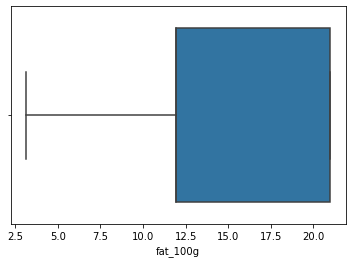

In [33]:
sb.boxplot(x=df['fat_100g'])

Le diagramme moustache nous montre que la variable 'fat_100g' est totalement nettoyer, plus de présence de valeur aberrante.

#### Détecter les valeurs aberrante de la variable 'saturated-fat_100g'

<AxesSubplot:xlabel='saturated-fat_100g'>

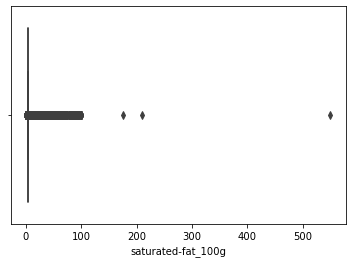

In [34]:
sb.boxplot(x=df['saturated-fat_100g'])

Le diagramme en moustache détecte un grand nombre de valeur aberrante celà ce distingue par une droite vertical et des points espacé.

#### Utilisation de la méthode interquartile sur la variable 'saturated-fat_100g'

In [35]:
Q1=df['saturated-fat_100g'].quantile(0.25)
Q3=df['saturated-fat_100g'].quantile(0.75)
IQR=Q3-Q1
print(Q1)
print(Q3)
print(IQR)
Lower_Whisker = Q1 - 1.5*IQR
Upper_Whisker = Q3 + 1.5*IQR
print(Lower_Whisker, Upper_Whisker)

4.46
4.5
0.040000000000000036
4.4 4.5600000000000005


Cette méthode me permet de relever les points de données qui tombe en dehors de 1,5 fois d’une plage interquartile au-dessus du 3e quartile (Q3= 4.5) et en dessous du 1er quartile (Q1= 4.46)

#### Traitement des valeurs aberrante 'saturated-fat_100g'

La mèthoque que j'utilise ci-dessous est de définir une variable nommé mask intégrant les valeurs non aberrante, ensuite redéfinir la variable 'saturated-fat_100g' en lui imputant la valeur haute sur les valeurs aberrante.

In [36]:
mask = (df['saturated-fat_100g']>Lower_Whisker) & (df['saturated-fat_100g']<Upper_Whisker)
df['saturated-fat_100g'] = df['saturated-fat_100g'].where(mask, Upper_Whisker)

<AxesSubplot:xlabel='saturated-fat_100g'>

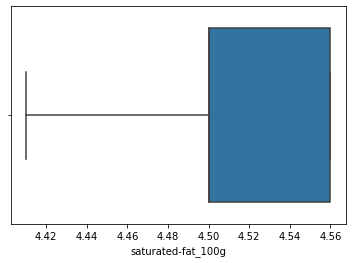

In [37]:
sb.boxplot(x=df['saturated-fat_100g'])

Le diagramme moustache nous montre que la variable 'saturated-fat_100g' est totalement nettoyer, plus de présence de valeur aberrante.

#### Détecter les valeurs aberrante de la variable 'carbohydrates_100g'

<AxesSubplot:xlabel='carbohydrates_100g'>

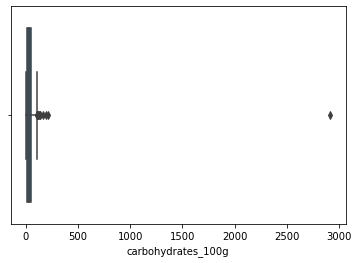

In [38]:
sb.boxplot(x=df['carbohydrates_100g'])

Le diagramme en moustache détecte un grand nombre de valeur aberrante celà ce distingue par une droite vertical et des points espacé.

#### Utilisation de la méthode interquartile sur la variable 'carbohydrates_100g'

In [39]:
Q1=df['carbohydrates_100g'].quantile(0.25)
Q3=df['carbohydrates_100g'].quantile(0.75)
IQR=Q3-Q1
print(Q1)
print(Q3)
print(IQR)
Lower_Whisker = Q1 - 1.5*IQR
Upper_Whisker = Q3 + 1.5*IQR
print(Lower_Whisker, Upper_Whisker)

13.9
49.9
36.0
-40.1 103.9


Cette méthode me permet de relever les points de données qui tombe en dehors de 1,5 fois d’une plage interquartile au-dessus du 3e quartile (Q3= 49.9) et en dessous du 1er quartile (Q1= 13.9)

#### Traitement des valeurs aberrante 'carbohydrates_100g'

La mèthoque que j'utilise ci-dessous est de définir une variable nommé mask intégrant les valeurs non aberrante, ensuite redéfinir la variable 'carbohydrates_100g' en lui imputant la valeur 100 sur les valeurs aberrante.
Car on ne peut pas dépassert les 100g.

In [40]:
mask = (df['carbohydrates_100g']>0) & (df['carbohydrates_100g']<100)
df['carbohydrates_100g'] = df['carbohydrates_100g'].where(mask, 100)

<AxesSubplot:xlabel='carbohydrates_100g'>

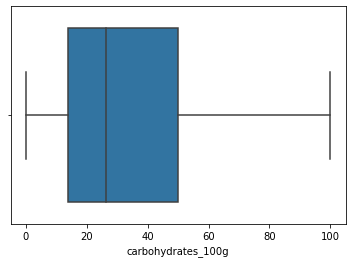

In [41]:
sb.boxplot(x=df['carbohydrates_100g'])

Le diagramme moustache nous montre que la variable 'carbohydrates_100g' est totalement nettoyer, plus de présence de valeur aberrante.

#### Détecter les valeurs aberrante de la variable 'sugars_100g'

<AxesSubplot:xlabel='sugars_100g'>

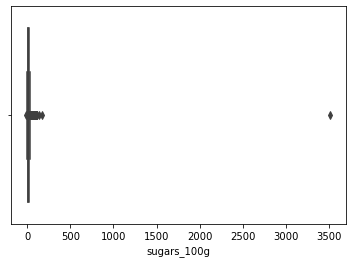

In [42]:
sb.boxplot(x=df['sugars_100g'])

Le diagramme en moustache détecte un grand nombre de valeur aberrante celà ce distingue par une droite vertical et des points espacé.

#### Utilisation de la méthode interquartile sur la variable 'sugars_100g'

In [43]:
Q1=df['sugars_100g'].quantile(0.25)
Q3=df['sugars_100g'].quantile(0.75)
IQR=Q3-Q1
print(Q1)
print(Q3)
print(IQR)
Lower_Whisker = Q1 - 1.5*IQR
Upper_Whisker = Q3 + 1.5*IQR
print(Lower_Whisker, Upper_Whisker)

5.0
14.84
9.84
-9.76 29.6


Cette méthode me permet de relever les points de données qui tombe en dehors de 1,5 fois d’une plage interquartile au-dessus du 3e quartile (Q3= 14.84) et en dessous du 1er quartile (Q1= 5.0)

#### Traitement des valeurs aberrante 'sugars_100g'

La mèthoque que j'utilise ci-dessous est de définir une variable nommé mask intégrant les valeurs non aberrante, ensuite redéfinir la variable 'sugars_100g' en lui imputant la valeur haute sur les valeurs aberrante.

In [44]:
mask = (df['sugars_100g']>0) & (df['sugars_100g']<Upper_Whisker)
df['sugars_100g'] = df['sugars_100g'].where(mask, Upper_Whisker)

<AxesSubplot:xlabel='sugars_100g'>

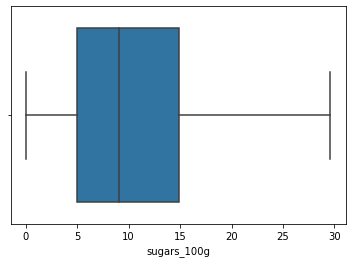

In [45]:
sb.boxplot(x=df['sugars_100g'])

Le diagramme moustache nous montre que la variable 'sugars_100g' est totalement nettoyer, plus de présence de valeur aberrante.

#### Détecter les valeurs aberrante de la variable 'proteins_100g'

<AxesSubplot:xlabel='proteins_100g'>

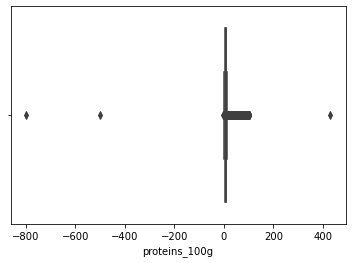

In [46]:
sb.boxplot(x=df['proteins_100g'])

Le diagramme en moustache détecte un grand nombre de valeur aberrante celà ce distingue par une droite vertical et des points espacé.

#### Utilisation de la méthode interquartile sur la variable 'proteins_100g'

In [47]:
Q1=df['proteins_100g'].quantile(0.25)
Q3=df['proteins_100g'].quantile(0.75)
IQR=Q3-Q1
print(Q1)
print(Q3)
print(IQR)
Lower_Whisker = Q1 - 1.5*IQR
Upper_Whisker = Q3 + 1.5*IQR
print(Lower_Whisker, Upper_Whisker)

5.0
8.24
3.24
0.13999999999999968 13.100000000000001


Cette méthode me permet de relever les points de données qui tombe en dehors de 1,5 fois d’une plage interquartile au-dessus du 3e quartile (Q3= 8.24) et en dessous du 1er quartile (Q1= 5.0)

#### Traitement des valeurs aberrante 'proteins_100g'

La mèthoque que j'utilise ci-dessous est de définir une variable nommé mask intégrant les valeurs non aberrante, ensuite redéfinir la variable 'proteins_100g' en lui imputant la valeur haute sur les valeurs aberrante.

In [48]:
mask = (df['proteins_100g']>Lower_Whisker) & (df['proteins_100g']<Upper_Whisker)
df['proteins_100g'] = df['proteins_100g'].where(mask, Upper_Whisker)

<AxesSubplot:xlabel='proteins_100g'>

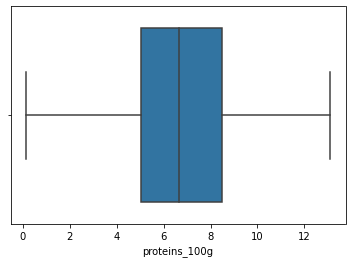

In [49]:
sb.boxplot(x=df['proteins_100g'])

Le diagramme moustache nous montre que la variable 'proteins_100g' est totalement nettoyer, plus de présence de valeur aberrante.

#### Détecter les valeurs aberrante de la variable 'salt_100g'

<AxesSubplot:xlabel='salt_100g'>

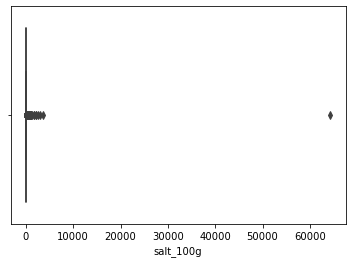

In [50]:
sb.boxplot(x=df['salt_100g'])

Le diagramme en moustache détecte un grand nombre de valeur aberrante celà ce distingue par une droite vertical et des points espacé.

#### Utilisation de la méthode interquartile sur la variable 'salt_100g'

In [51]:
Q1=df['salt_100g'].quantile(0.25)
Q3=df['salt_100g'].quantile(0.75)
IQR=Q3-Q1
print(Q1)
print(Q3)
print(IQR)
Lower_Whisker = Q1 - 1.5*IQR
Upper_Whisker = Q3 + 1.5*IQR
print(Lower_Whisker, Upper_Whisker)

0.4
1.11506
0.7150599999999999
-0.6725899999999999 2.1876499999999997


Cette méthode me permet de relever les points de données qui tombe en dehors de 1,5 fois d’une plage interquartile au-dessus du 3e quartile (Q3= 1.11506) et en dessous du 1er quartile (Q1= 0.4)

#### Traitement des valeurs aberrante 'salt_100g'

La mèthoque que j'utilise ci-dessous est de définir une variable nommé mask intégrant les valeurs non aberrante, ensuite redéfinir la variable 'salt_100g' en lui imputant la valeur haute sur les valeurs aberrante.

In [52]:
mask = (df['salt_100g']>0) & (df['salt_100g']<Upper_Whisker)
df['salt_100g'] = df['salt_100g'].where(mask, Upper_Whisker)

<AxesSubplot:xlabel='salt_100g'>

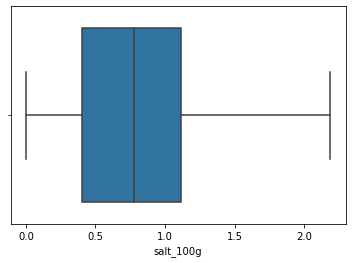

In [53]:
sb.boxplot(x=df['salt_100g'])

Le diagramme moustache nous montre que la variable 'salt_100g' est totalement nettoyer, plus de présence de valeur aberrante.

#### Détecter les valeurs aberrante de la variable 'sodium_100g'

<AxesSubplot:xlabel='sodium_100g'>

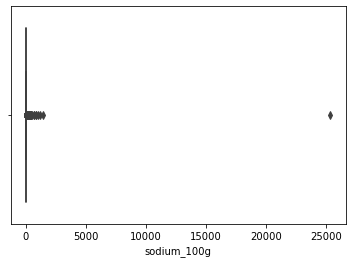

In [54]:
sb.boxplot(x=df['sodium_100g'])

Le diagramme en moustache détecte un grand nombre de valeur aberrante celà ce distingue par une droite vertical et des points espacé.

#### Utilisation de la méthode interquartile sur la variable 'sodium_100g'

In [55]:
Q1=df['sodium_100g'].quantile(0.25)
Q3=df['sodium_100g'].quantile(0.75)
IQR=Q3-Q1
print(Q1)
print(Q3)
print(IQR)
Lower_Whisker = Q1 - 1.5*IQR
Upper_Whisker = Q3 + 1.5*IQR
print(Lower_Whisker, Upper_Whisker)

0.15748031496063
0.439
0.28151968503936997
-0.264799212598425 0.861279527559055


Cette méthode me permet de relever les points de données qui tombe en dehors de 1,5 fois d’une plage interquartile au-dessus du 3e quartile (Q3= 0.439) et en dessous du 1er quartile (Q1= 0.15748031496063)

#### Traitement des valeurs aberrante 'sodium_100g'

La mèthoque que j'utilise ci-dessous est de définir une variable nommé mask intégrant les valeurs non aberrante, ensuite redéfinir la variable 'sodium_100g' en lui imputant la valeur haute sur les valeurs aberrante.

In [56]:
mask = (df['sodium_100g']>0) & (df['sodium_100g']<Upper_Whisker)
df['sodium_100g'] = df['sodium_100g'].where(mask, Upper_Whisker)

<AxesSubplot:xlabel='sodium_100g'>

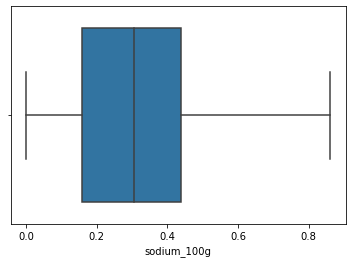

In [57]:
sb.boxplot(x=df['sodium_100g'])

Le diagramme moustache nous montre que la variable 'sodium_100g' est totalement nettoyer, plus de présence de valeur aberrante.

#### Détecter les valeurs aberrante de la variable 'nutrition-score-fr_100g'

<AxesSubplot:xlabel='nutrition-score-fr_100g'>

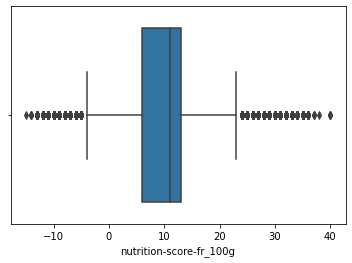

In [58]:
sb.boxplot(x=df['nutrition-score-fr_100g'])

Le diagramme en moustache détecte un grand nombre de valeur aberrante celà ce distingue par une droite vertical et des points espacé.

#### Utilisation de la méthode interquartile sur la variable 'nutrition-score-fr_100g'

In [59]:
Q1=df['nutrition-score-fr_100g'].quantile(0.25)
Q3=df['nutrition-score-fr_100g'].quantile(0.75)
IQR=Q3-Q1
print(Q1)
print(Q3)
print(IQR)
Lower_Whisker = Q1 - 1.5*IQR
Upper_Whisker = Q3 + 1.5*IQR
print(Lower_Whisker, Upper_Whisker)

6.0
13.0
7.0
-4.5 23.5


Cette méthode me permet de relever les points de données qui tombe en dehors de 1,5 fois d’une plage interquartile au-dessus du 3e quartile (Q3= 13.0) et en dessous du 1er quartile (Q1= 6.0)

#### Traitement des valeurs aberrante 'nutrition-score-fr_100g'

La mèthoque que j'utilise ci-dessous est de définir une variable nommé mask intégrant les valeurs non aberrante, ensuite redéfinir la variable 'nutrition-score-fr_100g' en lui imputant la valeur basse sur les valeurs aberrante.

In [60]:
mask = (df['nutrition-score-fr_100g']>Lower_Whisker) & (df['nutrition-score-fr_100g']<Upper_Whisker)
df['nutrition-score-fr_100g'] = df['nutrition-score-fr_100g'].where(mask, Lower_Whisker)

<AxesSubplot:xlabel='nutrition-score-fr_100g'>

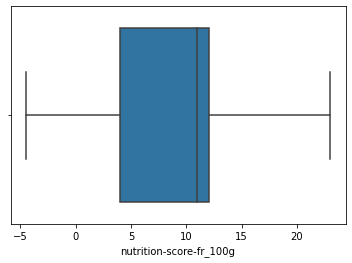

In [61]:
sb.boxplot(x=df['nutrition-score-fr_100g'])

Le diagramme moustache nous montre que la variable 'nutrition-score-fr_100g' est totalement nettoyer, plus de présence de valeur aberrante.

#### Détecter les valeurs aberrante de la variable 'nutrition-score-uk_100g'

<AxesSubplot:xlabel='nutrition-score-uk_100g'>

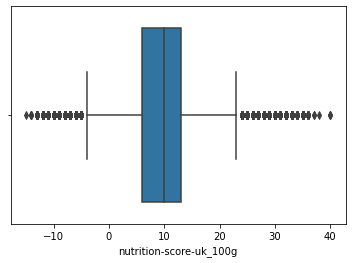

In [62]:
sb.boxplot(x=df['nutrition-score-uk_100g'])

Le diagramme en moustache détecte un grand nombre de valeur aberrante celà ce distingue par une droite vertical et des points espacé.

#### Utilisation de la méthode interquartile sur la variable 'nutrition-score-uk_100g'

In [63]:
Q1=df['nutrition-score-uk_100g'].quantile(0.25)
Q3=df['nutrition-score-uk_100g'].quantile(0.75)
IQR=Q3-Q1
print(Q1)
print(Q3)
print(IQR)
Lower_Whisker = Q1 - 1.5*IQR
Upper_Whisker = Q3 + 1.5*IQR
print(Lower_Whisker, Upper_Whisker)

6.0
13.0
7.0
-4.5 23.5


Cette méthode me permet de relever les points de données qui tombe en dehors de 1,5 fois d’une plage interquartile au-dessus du 3e quartile (Q3= 13.0) et en dessous du 1er quartile (Q1= 6.0)

#### Traitement des valeurs aberrante 'nutrition-score-uk_100g'

La mèthoque que j'utilise ci-dessous est de définir une variable nommé mask intégrant les valeurs non aberrante, ensuite redéfinir la variable 'nutrition-score-uk_100g' en lui imputant la valeur basse sur les valeurs aberrante.

In [64]:
mask = (df['nutrition-score-uk_100g']>Lower_Whisker) & (df['nutrition-score-uk_100g']<Upper_Whisker)
df['nutrition-score-uk_100g'] = df['nutrition-score-uk_100g'].where(mask, Lower_Whisker)

<AxesSubplot:xlabel='nutrition-score-uk_100g'>

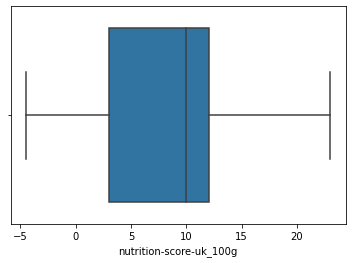

In [65]:
sb.boxplot(x=df['nutrition-score-uk_100g'])

Le diagramme moustache nous montre que la variable 'nutrition-score-uk_100g' est totalement nettoyer, plus de présence de valeur aberrante.

#### Identifier, quantifier et traiter les lignes dupliquées

In [66]:
df.shape

(320772, 30)

In [67]:
df = df.drop_duplicates(subset=['code', 'url', 'creator', 'created_t', 'created_datetime',
                                'last_modified_t', 'last_modified_datetime', 'product_name',
                                'brands', 'brands_tags', 'countries', 'countries_tags', 'countries_fr',
                                'ingredients_text', 'serving_size', 'additives', 'nutrition_grade_fr',
                                'states', 'states_tags', 'states_fr', 'energy_100g', 'fat_100g','saturated-fat_100g',
                                'carbohydrates_100g', 'sugars_100g', 'proteins_100g','salt_100g', 'sodium_100g',
                                'nutrition-score-fr_100g', 'nutrition-score-uk_100g'])

In [68]:
df.shape

(320771, 30)

Il y a une ligne dupliquée qui a été supprimer

## SYNTHESE DE MON ANALYSE DE DONNEES

### Representation d'une variable sous forme graphique

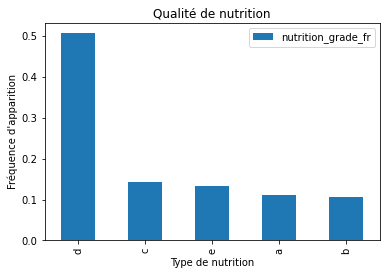

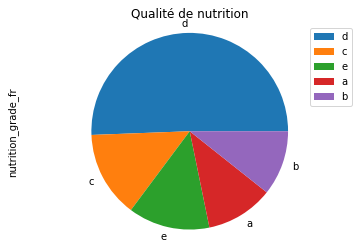

In [69]:
df['nutrition_grade_fr'].value_counts(normalize=True).plot(kind='bar')
plt.xlabel('Type de nutrition')
plt.ylabel('Fréquence d\'apparition')
plt.legend()
plt.title('Qualité de nutrition')
plt.show()
df['nutrition_grade_fr'].value_counts(normalize=True).plot(kind='pie')
plt.axis('equal') 
plt.legend()
plt.title('Qualité de nutrition')
plt.show()

Le produit  le plus favorable sur le plan nutritionnel (classé A) au produit le moins favorable sur le plan nutritionnel (classé E).
On constate que le curseur qualité nutritionnel penche principalement vers d.

### Representation de la variable 'nutrition_grade_fr'  sous forme de tableau

In [70]:
effectifs = df['nutrition_grade_fr'].value_counts()
modalites = effectifs.index 

tab = pd.DataFrame(modalites, columns = ['nutrition_grade_fr']) 
tab["n"] = effectifs.values
tab["f"] = tab["n"] / len(df) 
tab = tab.sort_values('nutrition_grade_fr')
tab["F"] = tab["f"].cumsum()
tab

,nutrition_grade_fr,n,f,F
3,a,35634,0.111089,0.111089
4,b,34245,0.106758,0.217847
1,c,45538,0.141964,0.359811
0,d,162324,0.506043,0.865854
2,e,43030,0.134146,1.000000


Le tableau ci-dessus, nous montre le nombre, la fréquence et la fréquence cumulée de chaque valeur de la variable 'nutrition_grade_fr'. 

### Analyse statistique par qualité nutritionnel 

In [71]:
df.groupby('nutrition_grade_fr').mean().head()

,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
nutrition_grade_fr,,,,,,,,,,
a,719.664484,15.065217,4.528177,29.470175,5.102043,7.355846,0.470875,0.185384,-2.904052,-2.903898
b,547.141751,13.484720,4.531970,19.675720,6.537832,5.607392,0.605583,0.238419,4.990261,4.645101
c,1018.341438,13.340310,4.538973,32.069334,10.722789,6.823762,0.968172,0.381171,6.367561,6.307139
d,1241.531184,13.751148,4.520024,33.601931,12.686343,7.131537,0.924207,0.363868,12.185838,11.628040
e,1832.609116,18.715844,4.556386,40.882469,19.777586,7.531806,1.084118,0.426818,12.957553,12.354543


Ce tableau ci-dessus, me permet d'identifier par valeur de qualité nutritionnel, les valeurs moyennes de chaque variables quantitatives. Celà nous indique deux choses intéressantes quand la quantité de sucre en gramme et le scrore nutritionnel augmentent plus la qualité nutritionnel est mauvaise. On le constate par le passage du curseur nutritionnel de a vers e.

### Calculer la moyenne, la mediane et les quantiles

In [72]:
df.describe()

,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
count,320771.000000,320771.000000,320771.000000,320771.000000,320771.000000,320771.000000,3.207710e+05,3.207710e+05,320771.000000,320771.000000
mean,1157.031353,14.476350,4.529773,32.415278,11.859913,7.003741,8.675240e-01,3.415485e-01,9.018870,8.610300
std,677.624348,5.163246,0.030213,24.213404,9.430582,3.546015,6.386133e-01,2.514202e-01,7.011748,7.025406
min,0.020000,3.120000,4.410000,0.001000,0.000100,0.140000,5.000000e-08,1.968504e-08,-4.500000,-4.500000
25%,598.000000,11.920000,4.500000,13.900000,5.000000,5.050000,4.000000e-01,1.574803e-01,4.000000,3.000000
50%,1153.000000,11.920000,4.500000,26.200000,9.100000,6.670000,7.747000e-01,3.050000e-01,11.000000,10.000000
75%,1569.000000,20.995000,4.560000,49.900000,14.870000,8.470000,1.115060e+00,4.390000e-01,12.000000,12.000000
max,3025.500000,20.995000,4.560000,100.000000,29.600000,13.100000,2.187650e+00,8.612795e-01,23.000000,23.000000


Le tableau ci-dessus, nous montre le calcul de la moyenne, la médiane et les quantiles de distribution de chaque variable quantitative.

### Analyser la corrélation entre 2 variables quantitative 'salt_100g' et 'sodium_100g'

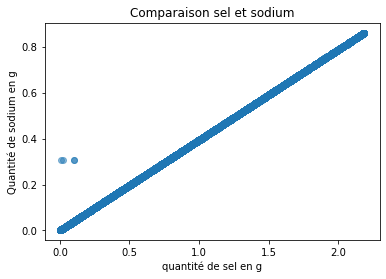

In [73]:
plt.plot(df['salt_100g'],df['sodium_100g'],'o',alpha=0.5)
plt.xlabel('quantité de sel en g')
plt.ylabel('Quantité de sodium en g')
plt.title('Comparaison sel et sodium')
plt.show()

Ce graphique nuage de point nous montre la présence d'une forte correlation, car le sel augmente de manière proportionnel au sodium. J'en conclu que le sel et le sodium sont idendique, je peux utilisé soi l'une soi l'autre de ces deux variables.

### Analyser la corrélation entre 2 variables quantitative 'nutrition-score-uk_100g' et 'nutrition-score-fr_100g'

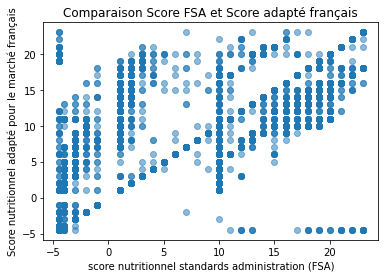

In [74]:
plt.plot(df['nutrition-score-uk_100g'],df['nutrition-score-fr_100g'],'o',alpha=0.5)
plt.xlabel('score nutritionnel standards administration (FSA)')
plt.ylabel('Score nutritionnel adapté pour le marché français')
plt.title('Comparaison Score FSA et Score adapté français')
plt.show()

Ce graphique nuage de point nous montre la présence d'une correlation, car le score FSA augmente proportionnelement au score adapté français. J'en conclu que score FSA et Score adapté au marché français sont partiellement idendique, je peux utilisé soi l'une soi l'autre de ces deux variables.

### Loi normale variable quantitative

In [75]:
!pip install fitter

In [76]:
from fitter import Fitter

#### Loi normale variable quantitative 'energy_100g'

,sumsquare_error,aic,bic,kl_div
norm,0.000049,1685.171592,-7.248499e+06,0.379183


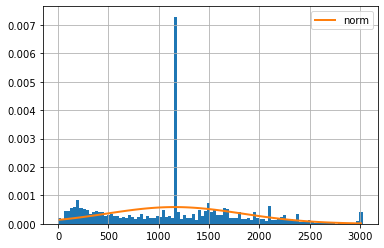

In [77]:
f = Fitter(df['energy_100g'], distributions = ('norm') )
f.fit()
f.summary()

In [78]:
sm.stats.diagnostic.kstest_normal(df['energy_100g'], dist='norm', pvalmethod='table')

(0.10925805318432746, 0.0009999999999998899)

Le resultat nous montre que la variable 'energy_100g' ne suit pas la loi normale, du faite que la valeur p est supérieur à 0,1 et que le résultat de la table est renvoyé.

#### Loi normale variable quantitative 'fat_100g'

,sumsquare_error,aic,bic,kl_div
norm,9.10936,637.91467,-3.358184e+06,1.770574


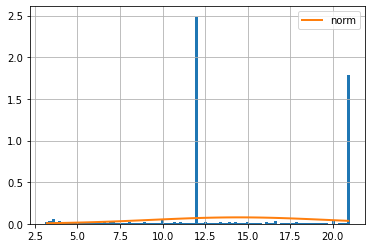

In [79]:
f = Fitter(df['fat_100g'], distributions = ('norm') )
f.fit()
f.summary()

In [80]:
sm.stats.diagnostic.kstest_normal(df['fat_100g'], dist='norm', pvalmethod='table')

(0.2771187328241531, 0.0009999999999998899)

Le resultat nous montre que la variable 'fat_100g' ne suit pas la loi normale, du faite que la valeur p est supérieur à 0,1 et que le résultat de la table est renvoyé.

#### Loi normale variable quantitative 'saturated-fat_100g'

,sumsquare_error,aic,bic,kl_div
norm,215804.712926,-87.113421,-127113.377563,inf


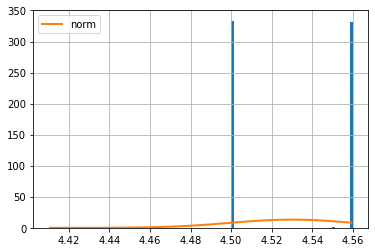

In [81]:
f = Fitter(df['saturated-fat_100g'], distributions = ('norm') )
f.fit()
f.summary()

In [82]:
sm.stats.diagnostic.kstest_normal(df['saturated-fat_100g'], dist='norm', pvalmethod='table')

(0.33969486302000024, 0.0009999999999998899)

Le resultat nous montre que la variable 'saturated-fat_100g' ne suit pas la loi normale, du faite que la valeur p est supérieur à 0,1 et que le résultat de la table est renvoyé.

#### Loi normale variable quantitative 'carbohydrates_100g'

,sumsquare_error,aic,bic,kl_div
norm,0.094496,1020.034521,-4.823626e+06,0.669502


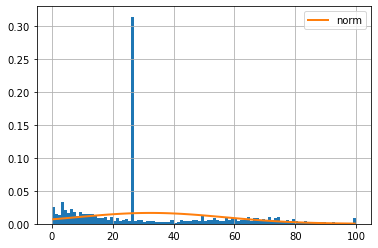

In [83]:
f = Fitter(df['carbohydrates_100g'], distributions = ('norm') )
f.fit()
f.summary()

In [84]:
sm.stats.diagnostic.kstest_normal(df['carbohydrates_100g'], dist='norm', pvalmethod='table')

(0.2552830175994809, 0.0009999999999998899)

Le resultat nous montre que la variable 'carbohydrates_100g' ne suit pas la loi normale, du faite que la valeur p est supérieur à 0,1 et que le résultat de la table est renvoyé.

#### Loi normale variable quantitative 'sugars_100g'

,sumsquare_error,aic,bic,kl_div
norm,1.698862,728.386902,-3.896869e+06,1.099207


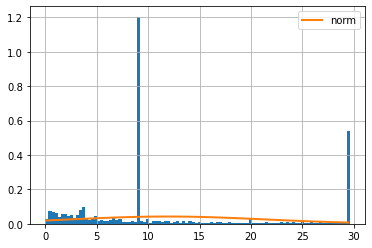

In [85]:
f = Fitter(df['sugars_100g'], distributions = ('norm') )
f.fit()
f.summary()

In [86]:
sm.stats.diagnostic.kstest_normal(df['sugars_100g'], dist='norm', pvalmethod='table')

(0.29116591971100836, 0.0009999999999998899)

Le resultat nous montre que la variable 'sugars_100g' ne suit pas la loi normale, du faite que la valeur p est supérieur à 0,1 et que le résultat de la table est renvoyé.

#### Loi normale variable quantitative 'proteins_100g'

,sumsquare_error,aic,bic,kl_div
norm,9.079368,553.426048,-3.359242e+06,0.962911


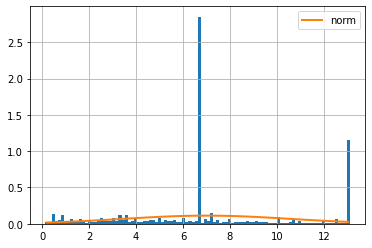

In [87]:
f = Fitter(df['proteins_100g'], distributions = ('norm') )
f.fit()
f.summary()

In [88]:
sm.stats.diagnostic.kstest_normal(df['proteins_100g'], dist='norm', pvalmethod='table')

(0.2130299751164223, 0.0009999999999998899)

Le resultat nous montre que la variable 'proteins_100g' ne suit pas la loi normale, du faite que la valeur p est supérieur à 0,1 et que le résultat de la table est renvoyé.

#### Loi normale variable quantitative 'salt_100g'

,sumsquare_error,aic,bic,kl_div
norm,222.703112,208.434958,-2.332828e+06,0.754862


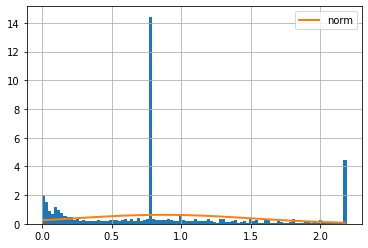

In [89]:
f = Fitter(df['salt_100g'], distributions = ('norm') )
f.fit()
f.summary()

In [90]:
sm.stats.diagnostic.kstest_normal(df['salt_100g'], dist='norm', pvalmethod='table')

(0.21286163640014105, 0.0009999999999998899)

Le resultat nous montre que la variable 'salt_100g' ne suit pas la loi normale, du faite que la valeur p est supérieur à 0,1 et que le résultat de la table est renvoyé.

#### Loi normale variable quantitative 'sodium_100g'

,sumsquare_error,aic,bic,kl_div
norm,1436.93606,22.001333,-1.734773e+06,0.754853


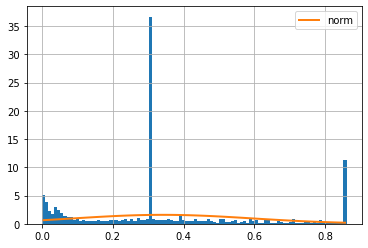

In [91]:
f = Fitter(df['sodium_100g'], distributions = ('norm') )
f.fit()
f.summary()

In [92]:
sm.stats.diagnostic.kstest_normal(df['sodium_100g'], dist='norm', pvalmethod='table')

(0.21287089984518442, 0.0009999999999998899)

Le resultat nous montre que la variable 'sodium_100g' ne suit pas la loi normale, du faite que la valeur p est supérieur à 0,1 et que le résultat de la table est renvoyé.

#### Loi normale variable quantitative 'nutrition-score-fr_100g'

,sumsquare_error,aic,bic,kl_div
norm,1.975088,705.584368,-3.848543e+06,inf


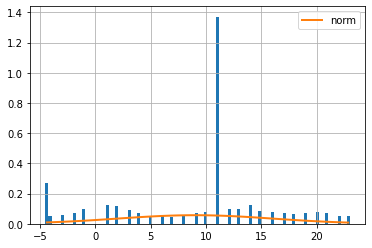

In [93]:
f = Fitter(df['nutrition-score-fr_100g'], distributions = ('norm') )
f.fit()
f.summary()

In [94]:
sm.stats.diagnostic.kstest_normal(df['nutrition-score-fr_100g'], dist='norm', pvalmethod='table')

(0.24779073460916723, 0.0009999999999998899)

Le resultat nous montre que la variable 'nutrition-score-fr_100g' ne suit pas la loi normale, du faite que la valeur p est supérieur à 0,1 et que le résultat de la table est renvoyé.

#### Loi normale variable quantitative 'nutrition-score-uk_100g'

,sumsquare_error,aic,bic,kl_div
norm,1.937282,706.196148,-3.854743e+06,inf


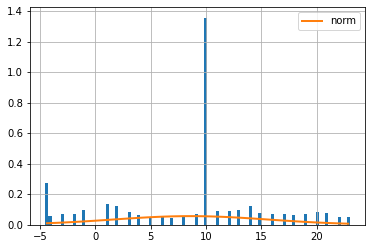

In [95]:
f = Fitter(df['nutrition-score-uk_100g'], distributions = ('norm') )
f.fit()
f.summary()

In [96]:
sm.stats.diagnostic.kstest_normal(df['nutrition-score-uk_100g'], dist='norm', pvalmethod='table')

(0.23383670955714914, 0.0009999999999998899)

Le resultat nous montre que la variable 'nutrition-score-uk_100g' ne suit pas la loi normale, du faite que la valeur p est supérieur à 0,1 et que le résultat de la table est renvoyé.

## METHODE D'ANALYSE EXPLICATIVE (ANOVA)

### Analysez la variable quantitative 'energy_100g'  et une qualitative 'nutrition_grade_fr'

In [97]:
X = 'nutrition_grade_fr'
Y = 'energy_100g' 
sous_echantillon = df[df['energy_100g'] > 0].copy()

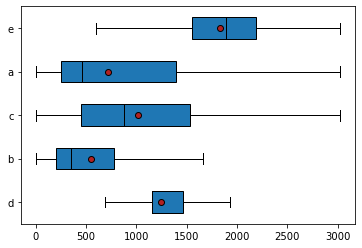

In [98]:
modalites = sous_echantillon[X].unique()
groupes = []
for m in modalites:
    groupes.append(sous_echantillon[sous_echantillon[X]==m][Y])
    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

Les points rouges au milieu de chaque boîte à moustache représentent la moyenne des valeurs de l'énergie en calories. On voit ici que les énergies sont très différents d'une catégorie à l'autre. Par exemple, les énergies dans le curseur qualité nutritionnel 'e' sont plus élevés et moins dispersés que les autres sauf le 'b' et le 'd' moins dispersés.

In [99]:
def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
    
eta_squared(sous_echantillon[X],sous_echantillon[Y])

0.2799143504266576

On obtient un résultat proche de 0.3, ce qui laisse penser qu'il y a effectivement une corrélation entre l'énergie calorique et leur qualité nutritionnel. C'est ce que nous avions observé sur le graphique ci-dessus.

### Analysez la variable quantitative 'fat_100g'  et une qualitative 'nutrition_grade_fr'

In [100]:
X = 'nutrition_grade_fr'
Y = 'fat_100g' 
sous_echantillon = df[df['fat_100g'] > 0].copy()

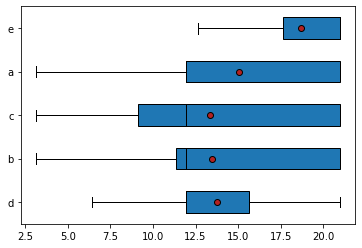

In [101]:
modalites = sous_echantillon[X].unique()
groupes = []
for m in modalites:
    groupes.append(sous_echantillon[sous_echantillon[X]==m][Y])
    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

Les points rouges au milieu de chaque boîte à moustache représentent la moyenne des valeurs de la graisse en gramme. On voit ici que les graisses sont très différents d'une catégorie à l'autre. Par exemple, les graisses dans le curseur qualité nutritionnel 'e' sont plus élevés et autant dispersés que les autres.

In [102]:
def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
    
eta_squared(sous_echantillon[X],sous_echantillon[Y])

0.11267826352880998

On obtient un résultat proche de 0.11, ce qui laisse penser qu'il y a effectivement une corrélation entre la quantité de graisse en gramme et leur qualité nutritionnel. C'est ce que nous avions observé sur le graphique ci-dessus.

### Analysez la variable quantitative 'saturated-fat_100g'  et une qualitative 'nutrition_grade_fr'

In [103]:
X = 'nutrition_grade_fr'
Y = 'saturated-fat_100g' 
sous_echantillon = df[df['saturated-fat_100g'] > 0].copy()

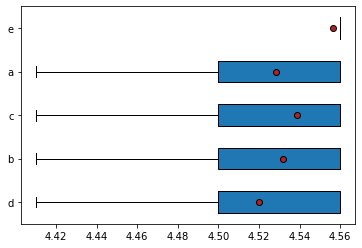

In [104]:
modalites = sous_echantillon[X].unique()
groupes = []
for m in modalites:
    groupes.append(sous_echantillon[sous_echantillon[X]==m][Y])
    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

Les points rouges au milieu de chaque boîte à moustache représentent la moyenne des valeurs de la graisse saturée en gramme. On voit ici que les graisses saturées sont très différents d'une catégorie à l'autre. Par exemple, les graisses saturées dans le curseur qualité nutritionnel 'e' sont plus élevés et moins dispersés que les autres.

In [105]:
def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
    
eta_squared(sous_echantillon[X],sous_echantillon[Y])

0.17081338073546698

On obtient un résultat proche de 0.17, ce qui laisse penser qu'il y a effectivement une corrélation entre la quantité de graisses saturées en gramme et leur qualité nutritionnel. C'est ce que nous avions observé sur le graphique ci-dessus.

### Analysez la variable quantitative 'carbohydrates_100g'  et une qualitative 'nutrition_grade_fr'

In [106]:
X = 'nutrition_grade_fr'
Y = 'carbohydrates_100g' 
sous_echantillon = df[df['carbohydrates_100g'] > 0].copy()

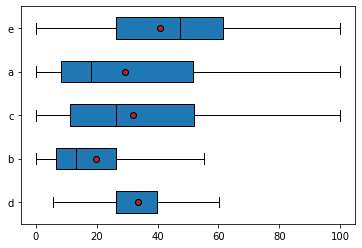

In [107]:
modalites = sous_echantillon[X].unique()
groupes = []
for m in modalites:
    groupes.append(sous_echantillon[sous_echantillon[X]==m][Y])
    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

Les points rouges au milieu de chaque boîte à moustache représentent la moyenne des valeurs du glucide en grammes. On voit ici que les glucides sont très différents d'une catégorie à l'autre. Par exemple, les glucides dans le curseur qualité nutritionnel 'e' sont plus élevés et autant dispersés que les autres sauf le 'b' moins dispersé.

In [108]:
def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
    
eta_squared(sous_echantillon[X],sous_echantillon[Y])

0.04884458570821124

On obtient un résultat proche de 0.05, ce qui laisse penser qu'il y a effectivement une corrélation entre la quantité de glucide en gramme et leur qualité nutritionnel. C'est ce que nous avions observé sur le graphique ci-dessus.

### Analysez la variable quantitative 'sugars_100g'  et une qualitative 'nutrition_grade_fr'

In [109]:
X = 'nutrition_grade_fr'
Y = 'sugars_100g' 
sous_echantillon = df[df['sugars_100g'] > 0].copy()

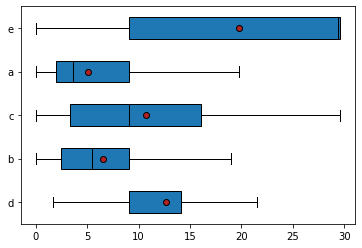

In [110]:
modalites = sous_echantillon[X].unique()
groupes = []
for m in modalites:
    groupes.append(sous_echantillon[sous_echantillon[X]==m][Y])
    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

Les points rouges au milieu de chaque boîte à moustache représentent la moyenne des valeurs du sucre en gramme. On voit ici que les sucres sont très différents d'une catégorie à l'autre. Par exemple, les sucres dans le curseur qualité nutritionnel 'e' sont plus élevés et moins dispersés que les autres sauf le 'a' et le 'b' moins dispersés.

In [111]:
def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
    
eta_squared(sous_echantillon[X],sous_echantillon[Y])

0.19155296248832263

On obtient un résultat proche de 0.19, ce qui laisse penser qu'il y a effectivement une corrélation entre la quantité du sucre en gramme et leur qualité nutritionnel. C'est ce que nous avions observé sur le graphique ci-dessus.

### Analysez la variable quantitative 'proteins_100g'  et une qualitative 'nutrition_grade_fr'

In [112]:
X = 'nutrition_grade_fr'
Y = 'proteins_100g' 
sous_echantillon = df[df['proteins_100g'] > 0].copy()

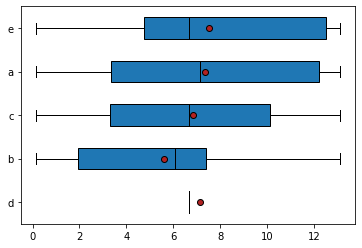

In [113]:
modalites = sous_echantillon[X].unique()
groupes = []
for m in modalites:
    groupes.append(sous_echantillon[sous_echantillon[X]==m][Y])
    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

Les points rouges au milieu de chaque boîte à moustache représentent la moyenne des valeurs de la protéine en gramme. On voit ici que les protéines sont très différents d'une catégorie à l'autre. Par exemple, les protéines dans le curseur qualité nutritionnel 'e' sont plus élevés et autant dispersés que les autres sauf le 'd'.

In [114]:
def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
    
eta_squared(sous_echantillon[X],sous_echantillon[Y])

0.021647461828146253

On obtient un résultat proche de 0.19, ce qui laisse penser qu'il y a effectivement une corrélation entre la quantité de protéines en gramme et leur qualité nutritionnel. C'est ce que nous avions observé sur le graphique ci-dessus.

### Analysez la variable quantitative 'salt_100g'  et une qualitative 'nutrition_grade_fr'

In [115]:
X = 'nutrition_grade_fr'
Y = 'salt_100g' 
sous_echantillon = df[df['salt_100g'] > 0].copy()

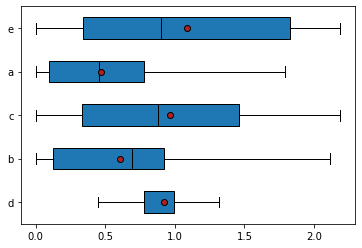

In [116]:
modalites = sous_echantillon[X].unique()
groupes = []
for m in modalites:
    groupes.append(sous_echantillon[sous_echantillon[X]==m][Y])
    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

Les points rouges au milieu de chaque boîte à moustache représentent la moyenne des valeurs du sel en gramme. On voit ici que les sels sont très différents d'une catégorie à l'autre. Par exemple, les sels dans le curseur qualité nutritionnel 'e' sont plus élevés et autant dispersés que les autres sauf le 'a' moins dispersés.

In [117]:
def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
    
eta_squared(sous_echantillon[X],sous_echantillon[Y])

0.08376063417697414

On obtient un résultat proche de 0.08, ce qui laisse penser qu'il y a effectivement une corrélation entre la quantité de sels en gramme et leur qualité nutritionnel. C'est ce que nous avions observé sur le graphique ci-dessus.

### Analysez la variable quantitative 'nutrition-score-fr_100g'  et une qualitative 'nutrition_grade_fr'

In [118]:
X = 'nutrition_grade_fr'
Y = 'nutrition-score-fr_100g'
sous_echantillon = df[df['nutrition-score-fr_100g'] > 0].copy()

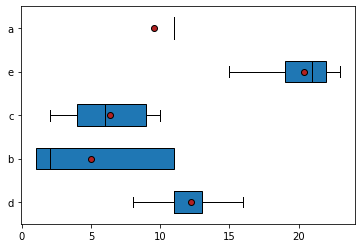

In [119]:
modalites = sous_echantillon[X].unique()
groupes = []
for m in modalites:
    groupes.append(sous_echantillon[sous_echantillon[X]==m][Y])
    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

Les points rouges au milieu de chaque boîte à moustache représentent la moyenne des valeurs du score nutritionnel adapté pour le marché français. On voit ici que les scores sont très différents d'une catégorie à l'autre. Par exemple, les scores dans le curseur qualité nutritionnel 'a' sont plus élevés et moins dispersés que les autres.

In [120]:
def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
    
eta_squared(sous_echantillon[X],sous_echantillon[Y])

0.7309082478293638

On obtient un résultat proche de 0.85, ce qui laisse penser qu'il y a pas de corrélation entre le score nutritionnel adapté pour le marché français et leur qualité nutritionnel. C'est ce que nous avions observé sur le graphique ci-dessus.

### Conclusion

J'en conclu que dans cette analyse bivariée de la variable quantitative 'proteins_100g’ et qualitative 'nutrition_grade_fr' à son rapport de corrélation le plus petit 0,02 très proche de 0 , ce qui laisse penser qu'il y a effectivement une corrélation entre la quantité de protéines en gramme et leur qualité nutritionnel.

## METHODE D'ANALYSE DESCRIPTIVE (ACP) 

### Choix du nombre de composantes à calculer

In [121]:
n_comp = 9

### Sélection des colonnes à prendre en compte dans l'ACP (Variables Quantitatives)

In [122]:
df_pca = df[['energy_100g', 'fat_100g','saturated-fat_100g','carbohydrates_100g', 'sugars_100g', 'proteins_100g',
             'salt_100g', 'sodium_100g','nutrition-score-fr_100g', 'nutrition-score-uk_100g']]

Les variables quantitatives que je veux prendre en compte dans le calcul de l'ACP

### Préparation des données pour l'ACP

In [123]:
X = df_pca.values
X

array([[1.1530e+03, 1.1920e+01, 4.5000e+00, ..., 3.0500e-01, 1.1000e+01,
        1.0000e+01],
       [2.2430e+03, 2.0995e+01, 4.5600e+00, ..., 3.0500e-01, 1.4000e+01,
        1.4000e+01],
       [1.9410e+03, 1.7860e+01, 4.5000e+00, ..., 2.5000e-01, 1.1000e+01,
        1.0000e+01],
       ...,
       [1.1530e+03, 1.1920e+01, 4.5000e+00, ..., 3.0500e-01, 1.1000e+01,
        1.0000e+01],
       [1.1530e+03, 1.1920e+01, 4.5000e+00, ..., 3.0500e-01, 1.1000e+01,
        1.0000e+01],
       [2.0920e+03, 1.1920e+01, 4.5000e+00, ..., 3.0500e-01, 1.1000e+01,
        1.0000e+01]])

### Sauvegarde des variables

In [124]:
names = df['code']
features = df_pca.columns

Comme ce type d'objet ne nous permet pas de retenir les noms des colonnes et les noms des lignes nous les sauvegardons dans les variables 'names' et 'features' 

### Centrage et Réduction

In [125]:
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

Ensuite nous centrons et réduisons les données 

### Calcul des composantes principales

In [126]:
pca = decomposition.PCA(n_components=n_comp)
pca.fit(X_scaled)

PCA(n_components=9)

A l'aide de l'objet decomposition de la librairie sklearn, nous initialisons un objet de type PCA, il sera chargé de calculer les composantes principales et nous lui spécifierons le nombres de composantes principales que nous lui avons défini plus haut. Ensuite nous fournissons à cette objet les données afin qu'il calcule les composantes principales

### Eboulis des valeurs propres

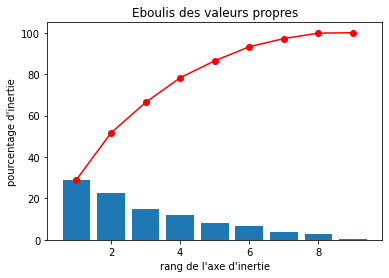

In [127]:
display_scree_plot(pca)

Ensuite nous pouvons afficher les éboulis des valeurs propre qui me permet d'afficher la courbe d'inertie. Je remarque quand réduisant mon nombre de composante à 2 celà représente 51,6% d'information qui peuvent me permettre de comprendre certaines choses sur mes variables quantitatives même si je perds 48,4% d'information.

### Cercle des corrélations

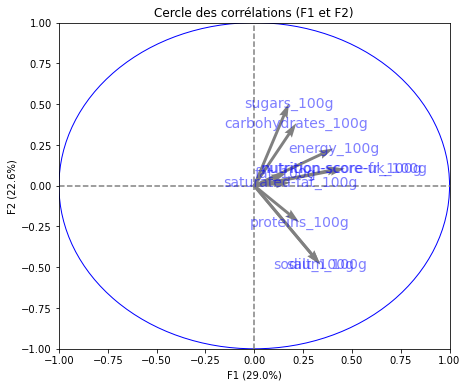

In [128]:
pcs = pca.components_
display_circles(pcs, n_comp, pca, [(0,1)], labels = np.array(features))

Pour ceci nous récupérons le calcul des différentes composantes dans l'objet pca que nous plaçons dans une nouvelle variable et ensuite nous transmettons ces composantes à la fonction display_circles et également le nombres de composantes, lobjet pca, les différents plan factoriel que nous souhaitons, ainsi que les noms des individus.
Cela nous montre une forte corrélation entre le sel et le sodium mais aussi entre le le score FSA et le score adapté français. 

### Conclusion

L'analyse par cercle de correlation permet de confirmer certaine chose, en premier lieu j'avais constaté sur mon analyse statistique par qualité nutritionnel que la quantité de sucre en gramme et le scrore nutritionnel augmentent plus la qualité nutritionnel est mauvaise, cela se confirme sur ce graphique nous indiquant les fléches de nos 3 variables situé en haut à droite de l'absice du cercle. En second lieu, j'avais consaté sur mon analyse de la corrélation entre 'salt_100g' et 'sodium_100g' une forte corrélation, cela se confirme sur ce graphique nous indiquant par une fléche ces 2 variable situé en bas à droite de l'absice du cercle. En troisième lieu, en effectuant mon analyse bivarié entre la variable protéine et qualité nutritionnel, j'en avais détuit que plus la quantité de protéine augmente plus la qualité nutritionnel est bonne,  cela se confirme sur ce graphique par le positionnement de la fléche protéine situé en bas à droite de l'absice du cercle, de plus il en ressors une information complémentaire, plus la quantité de sel augmente plus la qualité nutritionnel est bonne. J'en conclu aussi que le cercle de correlations nous montre que le sucre et le sel sont fortement corrélés à F2, et graisse saturé, graisse, nutrition score sont fortement corrélés à F1.

## CLASSEMENT DES PAYS ET DES MARQUES EN FONCTION EN FONCTION DE LEUR SCORE NUTRITIONNEL ADAPTE AU MARCHE FRANCAIS

### Nutrition score par pays

In [129]:
df.groupby('countries')['nutrition-score-fr_100g'].mean().head(10)

countries
ALLEMAGNE                     11.000000
Albania                       11.000000
Albania,Italia                14.000000
Albania,Italia, en:denmark    11.000000
Albania,Italy                  2.666667
Alemanha,Portugal,Espanha      7.000000
Alemania, España               4.500000
Alemania,España                8.464286
Algeria                       11.000000
Algeria, en:france            11.000000
Name: nutrition-score-fr_100g, dtype: float64

Ce tableau nous indique le classement des pays avec leurs score nutritionnel, on s'apperçoit que la combinaison de 2 pays Albanie et Italie nous donne la meilleur moyenne de score nutritionnel 2.66 sur les 10 affichés.

### Nutrition score par marque

In [130]:
df.groupby('brands')['nutrition-score-fr_100g'].mean().head(10)

brands
 365 дней                  11.0
 Act II                    11.0
 Annie's                   11.0
 Boucherie                 11.0
 Carrefour                 11.0
 Casino                    11.0
 Casino                    11.0
 Casino délices            11.0
 Core Meal, Core Method    -2.0
 Debic                     11.0
Name: nutrition-score-fr_100g, dtype: float64

Ce tableau nous indique le classement des marques avec leurs score nutritionnel, on s'apperçoit que la combinaison de 2 marques Core Meal et Core Method nous donne la meilleur moyenne de score nutritionnel -2.0 sur les 10 affichés.

## CONCLUSION GENERALE

### Pour conclure sur mon analyse exploratoire de mon jeu de données, il y a plusieurs chose à retenir:
### * Plus la quantité de sucre en gramme augmente, plus le score nutritionnel augmente plus la qualité nutritionnel est mauvaise,
### * Le sel augmente de manière proportionnel au sodium,  plus le sel augmente, plus le score nutritionnel diminue plus la qualité nutritionnel est bonne,
### * La variable énergie 100g qui se rapproche le plus de la loi normal, néanmoins elle ne la suit pas,
### * Plus la quantité de protéine augmente, plus le score nutritionnel diminue, plus la qualité nutritionnel est bonne,
### * La combinaison de 2 pays Albanie et Italie nous donne la meilleur moyenne de score nutritionnel 2.66,
### * La combinaison de 2 marques Core Meal et Core Method nous donne la meilleur moyenne de score nutritionnel -2.0